# Imports

In [1]:
import logging, warnings; logging.getLogger().setLevel(logging.ERROR);
warnings.filterwarnings("ignore")

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import re
from pathlib import Path 

import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.font_manager
import matplotlib.lines as lines


pd.set_option('display.max_rows', 200)

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=12)

sc.settings.n_jobs=-1
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.figdir = '../../1_outputs/0_figures'
sc.settings.verbosity = 1 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

In [2]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [3]:
# preset color palettes and color maps
user_defined_palette =  [ '#F6222E', '#16FF32', '#3283FE', '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']

user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [4]:
pwd

'/Users/mkaur/projects/7_dc/1_pyzone/0_notebooks/0_scRNA'

In [5]:
file_outputs = '../../1_outputs/' 
h5ad = '../../1_outputs/1_h5ad/'

## Read in WIP adata and other cell type specific adata files

In [6]:
## read in h5ad 

adata = sc.read_h5ad(h5ad + "4_wip_QCed_adata.h5ad")
dn_dp = sc.read_h5ad(h5ad + "4_dn_dp.h5ad")
sp = sc.read_h5ad(h5ad + "5_sp.h5ad")
nk_ilc = sc.read_h5ad(h5ad + "6_bcells.h5ad")
bcell = sc.read_h5ad(h5ad + "7_nk_ilc.h5ad")
myeloid = sc.read_h5ad(h5ad + "8_myeloid.h5ad")

## Map back to OG UMAP

In [7]:
adata.obs['cell_type'].unique().to_list()

['ILC', 'DN_DP', 'SP', 'B', 'Myeloid']

### Fill in the brackets below with the subsets you annotated beyond just the broad annotation. 

In [8]:
temp = adata[~adata.obs['cell_type'].isin(['ILC', 'DN_DP', 'SP', 'B', 'Myeloid'])].obs['cell_type'].copy()
temp

Series([], Name: cell_type, dtype: category
Categories (0, object): [])

### Fill in the bracket below with the data column in the subset that contains the annotations.

In [9]:
with_renamed_subsets = pd.concat([
                                  dn_dp.obs['cell_type_subset'],
                                  sp.obs['cell_type_subset'], 
                                  nk_ilc.obs['cell_type_subset'], 
                                  bcell.obs['cell_type_subset'],
                                  myeloid.obs['cell_type_subset'],
                                  temp])

In [10]:
adata.obs['cell_type_subset'] = ''

In [11]:
adata.obs['cell_type_subset'][adata.obs.index.isin(with_renamed_subsets.index) == True] = with_renamed_subsets

In [12]:
adata = adata[~adata.obs['cell_type_subset'].isin([''])].copy()
adata

AnnData object with n_obs × n_vars = 37630 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type', 'cell_type_subset'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', '

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

In [14]:
sc.tl.pca(adata, n_comps=50, svd_solver='arpack', random_state=42, use_highly_variable=True) #change use_highly_variable == True if you ran the block above

<function matplotlib.pyplot.show(close=None, block=None)>

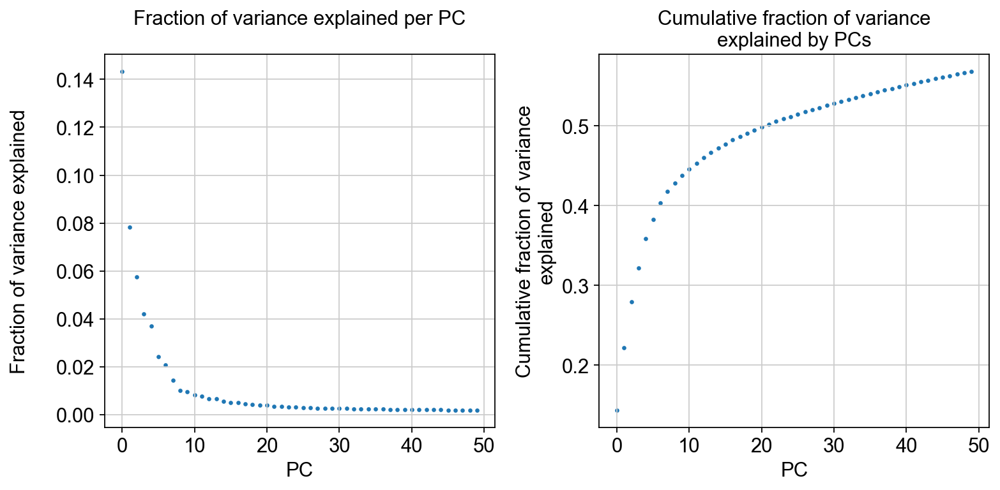

In [15]:
observe_variance(adata)

In [16]:
#adata = sc.read_h5ad(h5ad + '13_adata_final.h5ad')

In [17]:
sc.tl.pca(adata, n_comps=15, svd_solver='arpack', random_state=42, use_highly_variable=True) #change use_highly_variable == True if you ran the block above

#### Harmony integrate the data if there are large batch effects

In [18]:
sce.pp.harmony_integrate(adata, ['sample'], max_iter_harmony = 20) # Usually you want to run based on replicates but you can also run based on other parameters

2026-07-20 20:45:18,430 - harmonypy - INFO - Iteration 1 of 20
2026-07-20 20:45:22,907 - harmonypy - INFO - Iteration 2 of 20
2026-07-20 20:45:27,186 - harmonypy - INFO - Iteration 3 of 20
2026-07-20 20:45:31,250 - harmonypy - INFO - Iteration 4 of 20
2026-07-20 20:45:35,233 - harmonypy - INFO - Iteration 5 of 20
2026-07-20 20:45:39,214 - harmonypy - INFO - Converged after 5 iterations


If you batch corrected, make sure to use the use_rep = 'X_pca_harmony' paremeter below

In [19]:
sc.pp.neighbors(adata, n_neighbors=25, random_state=42, use_rep='X_pca_harmony')  # Change use_rep == X_pca_harmony if you ran the block above

In [20]:
sc.tl.umap(adata, random_state=42)#, spread = 1.3), min_dist=0.2, spread = 1.3

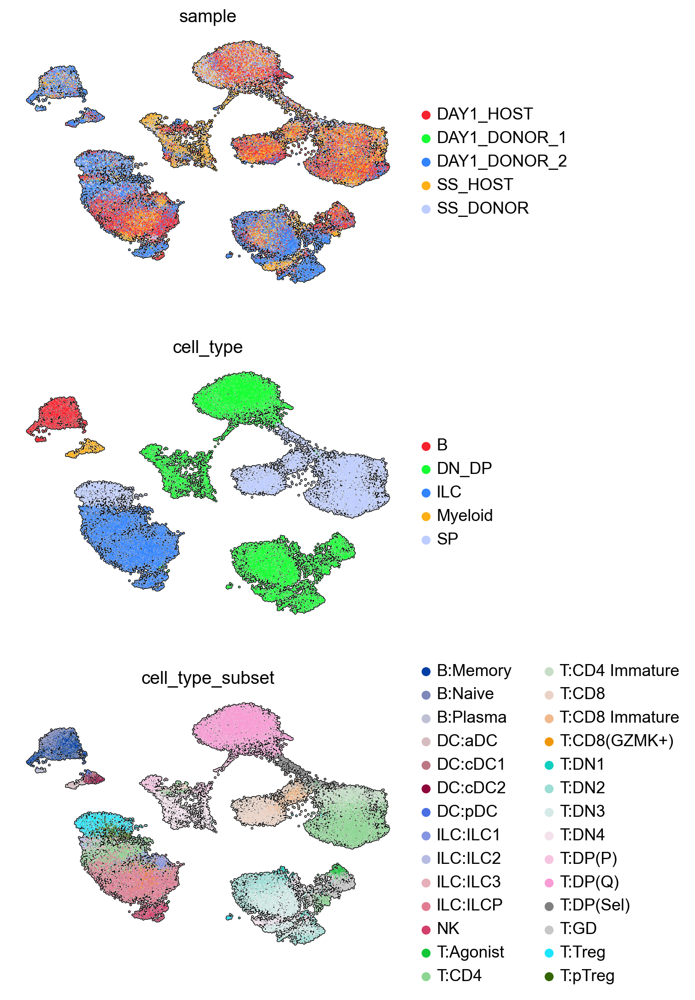

In [21]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='Spectral_r', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'sample', 'cell_type', 'cell_type_subset',
          ],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=1,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False, 
    #legend_loc = 'on data'
    
)

In [22]:
adata.write_h5ad(h5ad + '9_adata_final.h5ad')

## Clean up Annotation

In [23]:
#adata = sc.read_h5ad(h5ad + '9_adata_final.h5ad')

In [24]:
adata.obs['cell_type_subset'].value_counts()

cell_type_subset
T:DP(Q)           7278
T:CD4             6467
ILC:ILCP          4489
T:DN3             3198
T:CD8             2375
T:CD4 Immature    2122
T:DN2             2038
T:DN4             1763
T:Treg            1185
B:Memory          1000
T:GD               839
B:Naive            776
T:CD8 Immature     609
T:DP(P)            528
T:DP(Sel)          493
NK                 467
ILC:ILC1           405
T:pTreg            266
T:CD8(GZMK+)       225
T:Agonist          212
ILC:ILC3           180
ILC:ILC2           163
DC:cDC2            158
DC:aDC             140
T:DN1               94
B:Plasma            80
DC:cDC1             51
DC:pDC              29
Name: count, dtype: int64

In [25]:
celltype_order = [
    'T:DN1', 'T:DN2', 'T:DN3', 'T:DN4', 'T:DP(P)',
    'T:DP(Q)', 'T:DP(Sel)',
    'T:Agonist',
    'T:CD4 Immature', 'T:CD4', 'T:pTreg', 'T:Treg', 
    'T:CD8 Immature', 'T:CD8', 'T:CD8(GZMK+)',
    'T:GD',
    # NKT / NK
    'NK',

    'B:Naive', 'B:Memory', 'B:Plasma',
    # DCs
    'DC:cDC1', 'DC:cDC2', 'DC:pDC', 'DC:aDC',
    # ILCs
    'ILC:ILCP', 'ILC:ILC1','ILC:ILC2', 'ILC:ILC3',

]

In [26]:
adata.obs['cell_type_subset'] = pd.Categorical(
    adata.obs['cell_type_subset'],
    categories=celltype_order,
    ordered=True,
)

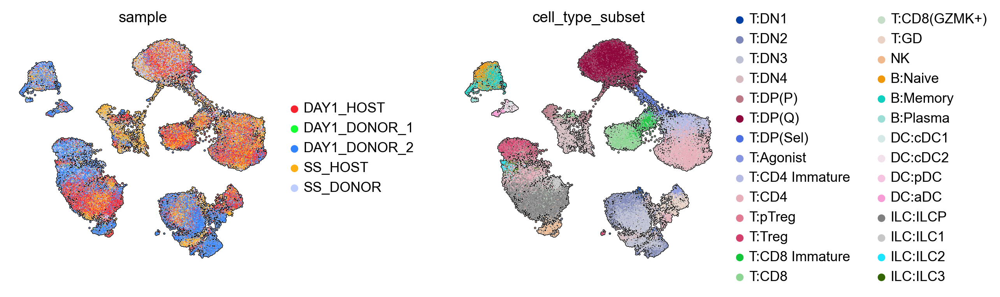

In [27]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['sample', 'cell_type_subset'],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

## Create Umbrella Annotation

In [32]:
umbrella_mapping = {
    # DN
    'T:DN1':                                'T',
    'T:DN2':                                'T',
    'T:DN3':                                'T',
    'T:DN4':                                'T',
    # DP
    'T:DP(Q)':                              'T',
    'T:DP(P)':                              'T',
    'T:DP(Sel)':                            'T',
    # SP
    'T:CD4 Immature':                       'T',
    'T:CD4':                                'T',
    'T:pTreg':                              'T',

    'T:Treg':                              'T',
    'T:CD8 Immature':                       'T',
    'T:CD8':                                'T',
    # Unconventional T
    'T:Agonist':                            'T',
    'T:CD8(GZMK+)':                          'T',
    'T:GD':                                 'T',
    # B cells
    'B:Naive':                              'B',
    'B:Memory':                             'B',
    'B:Plasma':                             'B',
    # DCs
    'DC:cDC1':                              'DC',
    'DC:cDC2':                              'DC',
    'DC:pDC':                               'DC',
    'DC:aDC':                               'DC',

    # ILCs (including NK)
    'NK':                                   'NK',
    'ILC:ILCP':                             'ILC',
    'ILC:ILC1':                             'ILC',
        'ILC:ILC2':                             'ILC',

    'ILC:ILC3':                             'ILC',
}

umbrella_order = [
    'T', 'ILC',
    'NK',  'B', 'DC'
]

In [33]:
adata.obs['cell_type_umbrella'] = (
    adata.obs['cell_type_subset']
    .map(umbrella_mapping)
)

In [34]:
adata.obs['cell_type_umbrella'] = pd.Categorical(
    adata.obs['cell_type_umbrella'],
    categories=umbrella_order,
    ordered=True,
)

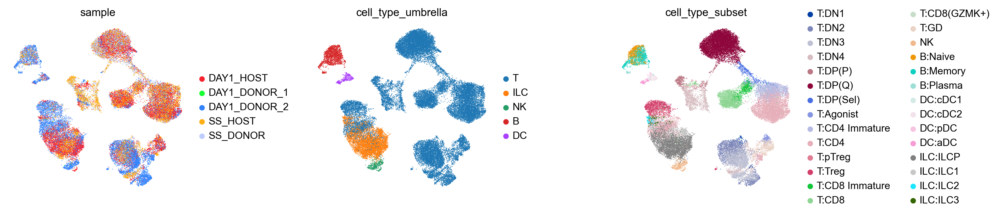

In [35]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['sample', 'cell_type_umbrella', 'cell_type_subset'],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    #add_outline=True,
    sort_order = False
)

In [36]:
len(adata.obs['cell_type_subset'].unique())

28

In [37]:
list(adata.obs['cell_type_subset'].unique())

['T:CD4',
 'T:DP(Q)',
 'T:CD4 Immature',
 'T:DP(P)',
 'T:CD8',
 'B:Memory',
 'ILC:ILCP',
 'T:Treg',
 'T:DN2',
 'T:DN4',
 'ILC:ILC2',
 'B:Naive',
 'T:pTreg',
 'T:DN3',
 'T:CD8 Immature',
 'NK',
 'DC:cDC2',
 'ILC:ILC3',
 'T:GD',
 'ILC:ILC1',
 'T:DP(Sel)',
 'DC:aDC',
 'T:CD8(GZMK+)',
 'T:DN1',
 'T:Agonist',
 'B:Plasma',
 'DC:cDC1',
 'DC:pDC']

In [38]:
adata.write_h5ad(h5ad + '9_adata_final.h5ad')

In [ ]:
#adata = sc.read_h5ad(h5ad + '15_adata_final.h5ad')

In [41]:
colors = ['#90AD1C','#E35BD1', '#3283FE', 
          '#FEAF16', '#BDCDFF', '#3B00FB', 
          '#1CFFCE', '#C075A6', '#F8A19F', 
          '#B5EFB5', '#FBE426', '#C4451C', 
          '#2ED9FF', '#c1c119', '#8b0000',
          '#FE00FA', '#1CBE4F', '#1C8356', '#FF6E3A',
          '#0e452b', '#AA0DFE', '#B5EFB5',
          '#325A9B', '#F6222E',
          '#6B4C9A', '#D4A017',
          '#22ADA0', '#16FF32',
]

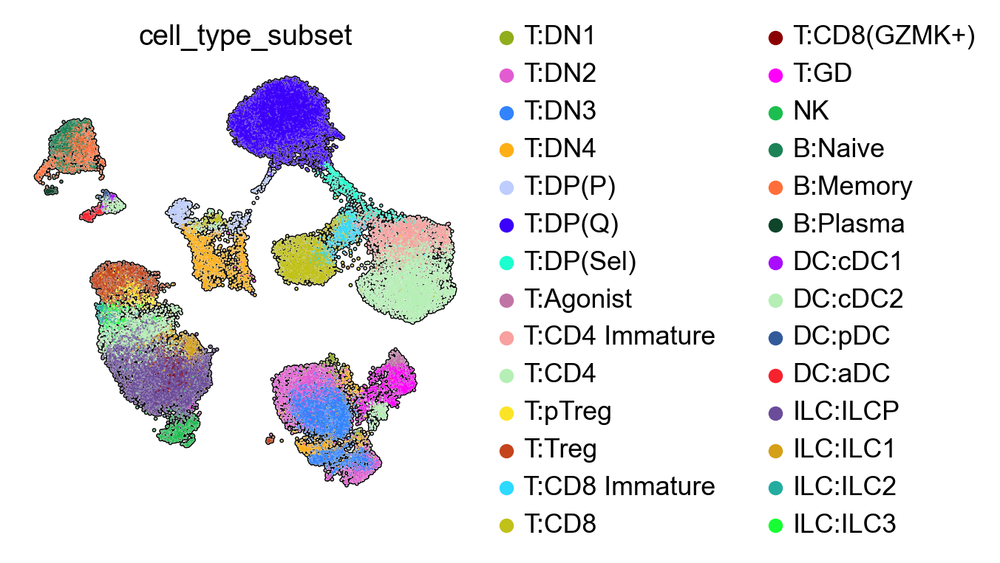

In [42]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['cell_type_subset'],  
    #color_map=user_defined_palette ,
    palette = colors,
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False, 
    save='_cell_type_subset.pdf'
)

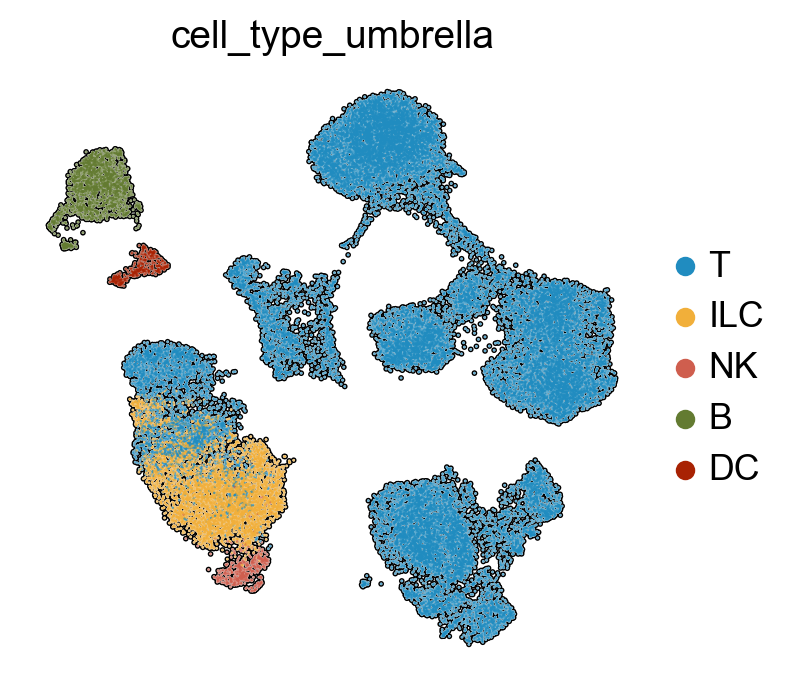

In [43]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='Spectral_r', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['cell_type_umbrella'],  
    #color_map=user_defined_palette ,
    palette = [  '#208CC0FF', '#F1AF3AFF', '#CF5E4EFF', '#637B31FF',  '#A82203FF', '#003967FF'],
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    #size=5,
    frameon=False,
    add_outline=True,
    sort_order = False, 
    save='_cell_type_umbrella.pdf'
)

## Marker Genes

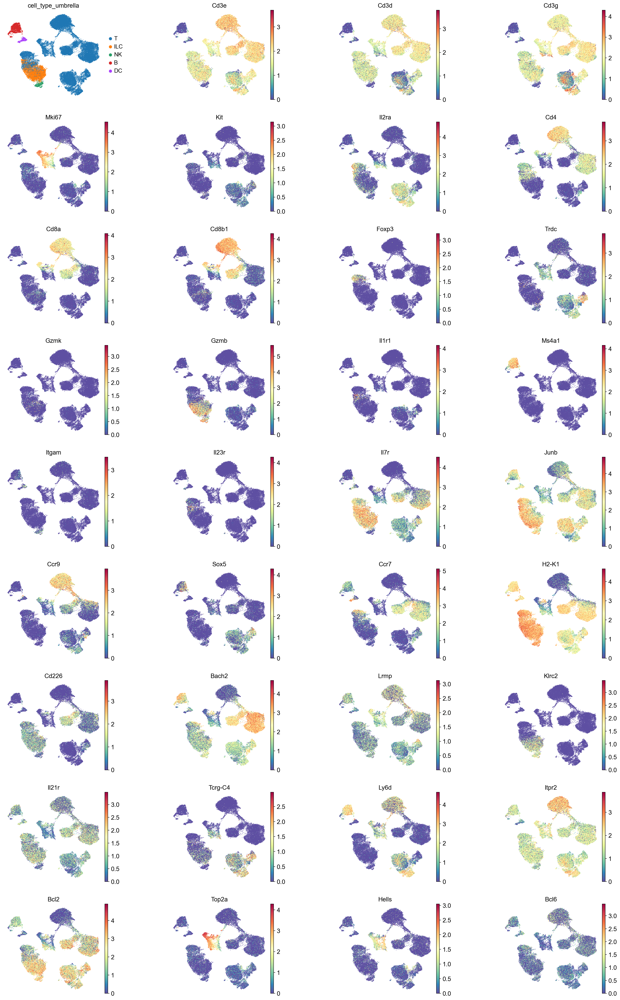

In [65]:
sc.set_figure_params(dpi=100, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=[
        'cell_type_umbrella',
        'Cd3e', 'Cd3d', 'Cd3g', 'Mki67',
        'Kit', 'Il2ra', 'Cd4', 'Cd8a', 'Cd8b1', 'Foxp3',
        'Trdc', 'Gzmk', 'Gzmb', 'Il1r1', 'Ms4a1', 'Itgam',
        'Il23r', 'Il7r', 'Junb', 'Ccr9', 'Sox5', 'Ccr7', 'H2-K1', 
        'Cd226', 'Bach2', 'Lrmp', 'Klrc2', 'Il21r', 'Tcrg-C4',
        'Ly6d', 'Itpr2', 'Bcl2', 'Top2a', 'Hells', 'Bcl6'

    ],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    #add_outline=True,
    sort_order = False
)

## Clean adata

In [57]:
adata

AnnData object with n_obs × n_vars = 37630 × 26036
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'keep_cell', 'cell_type', 'cell_type_subset', 'cell_type_umbrella'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'me

In [58]:
adata.obs['condition']

GCGACTTAGGATCACC-1@DAY1_DONOR_2    D1_Recirculating
TACGCAATCGCTCCGT-1@SS_DONOR        SS_Recirculating
GTGTTACGTTCGGCAC-1@SS_HOST              SS_Resident
CCTGAATGTTCCGTAG-1@SS_DONOR        SS_Recirculating
CGCTGTTCAATTCAAG-1@SS_HOST              SS_Resident
                                         ...       
AAGTCAGGTTCGGGTC-1@DAY1_DONOR_2    D1_Recirculating
CCGCAATAGGCTCAGT-1@DAY1_HOST            D1_Resident
GGTATGTCAAGTGCCA-1@DAY1_HOST            D1_Resident
GCCAAATCAAACCGGC-1@SS_HOST              SS_Resident
AATGACTTCCGTTGCC-1@DAY1_HOST            D1_Resident
Name: condition, Length: 37630, dtype: category
Categories (4, object): ['D1_Recirculating', 'D1_Resident', 'SS_Recirculating', 'SS_Resident']

In [59]:
cell_type_groups = {

    'Recirculating': ['D1_Recirculating', 'SS_Recirculating'], 
    'Resident': ['D1_Resident', 'SS_Resident']
    
}

cluster_to_cell_type = {cluster: cell_type for cell_type, clusters in cell_type_groups.items() for cluster in clusters}

In [60]:
adata.obs['source'] = adata.obs['condition'].map(cluster_to_cell_type) #Add Leiden Cluster
adata.obs['source'] 

GCGACTTAGGATCACC-1@DAY1_DONOR_2    Recirculating
TACGCAATCGCTCCGT-1@SS_DONOR        Recirculating
GTGTTACGTTCGGCAC-1@SS_HOST              Resident
CCTGAATGTTCCGTAG-1@SS_DONOR        Recirculating
CGCTGTTCAATTCAAG-1@SS_HOST              Resident
                                       ...      
AAGTCAGGTTCGGGTC-1@DAY1_DONOR_2    Recirculating
CCGCAATAGGCTCAGT-1@DAY1_HOST            Resident
GGTATGTCAAGTGCCA-1@DAY1_HOST            Resident
GCCAAATCAAACCGGC-1@SS_HOST              Resident
AATGACTTCCGTTGCC-1@DAY1_HOST            Resident
Name: source, Length: 37630, dtype: object

In [61]:
cell_type_groups = {

    'D1': ['D1_Recirculating', 'D1_Resident'], 
    'Steady State': ['SS_Recirculating', 'SS_Resident']
    
}

cluster_to_cell_type = {cluster: cell_type for cell_type, clusters in cell_type_groups.items() for cluster in clusters}

In [62]:
adata.obs['day'] = adata.obs['condition'].map(cluster_to_cell_type) #Add Leiden Cluster
adata.obs['day'] 

GCGACTTAGGATCACC-1@DAY1_DONOR_2              D1
TACGCAATCGCTCCGT-1@SS_DONOR        Steady State
GTGTTACGTTCGGCAC-1@SS_HOST         Steady State
CCTGAATGTTCCGTAG-1@SS_DONOR        Steady State
CGCTGTTCAATTCAAG-1@SS_HOST         Steady State
                                       ...     
AAGTCAGGTTCGGGTC-1@DAY1_DONOR_2              D1
CCGCAATAGGCTCAGT-1@DAY1_HOST                 D1
GGTATGTCAAGTGCCA-1@DAY1_HOST                 D1
GCCAAATCAAACCGGC-1@SS_HOST         Steady State
AATGACTTCCGTTGCC-1@DAY1_HOST                 D1
Name: day, Length: 37630, dtype: object

In [63]:
adata.obs['condition']

GCGACTTAGGATCACC-1@DAY1_DONOR_2    D1_Recirculating
TACGCAATCGCTCCGT-1@SS_DONOR        SS_Recirculating
GTGTTACGTTCGGCAC-1@SS_HOST              SS_Resident
CCTGAATGTTCCGTAG-1@SS_DONOR        SS_Recirculating
CGCTGTTCAATTCAAG-1@SS_HOST              SS_Resident
                                         ...       
AAGTCAGGTTCGGGTC-1@DAY1_DONOR_2    D1_Recirculating
CCGCAATAGGCTCAGT-1@DAY1_HOST            D1_Resident
GGTATGTCAAGTGCCA-1@DAY1_HOST            D1_Resident
GCCAAATCAAACCGGC-1@SS_HOST              SS_Resident
AATGACTTCCGTTGCC-1@DAY1_HOST            D1_Resident
Name: condition, Length: 37630, dtype: category
Categories (4, object): ['D1_Recirculating', 'D1_Resident', 'SS_Recirculating', 'SS_Resident']

In [66]:
adata.obs['condition'].unique().to_list()

['D1_Recirculating', 'SS_Recirculating', 'SS_Resident', 'D1_Resident']

In [67]:
adata.obs['umbrella_condition'] = (
    adata.obs['cell_type_umbrella'].astype(str) + '_' + adata.obs['condition'].astype(str)
)

adata.obs['umbrella_condition'] = adata.obs['umbrella_condition'].astype('category')

In [68]:
adata.obs['umbrella_condition'].unique().to_list()

['T_D1_Recirculating',
 'T_SS_Recirculating',
 'T_SS_Resident',
 'T_D1_Resident',
 'B_D1_Recirculating',
 'ILC_D1_Resident',
 'ILC_D1_Recirculating',
 'NK_D1_Recirculating',
 'DC_D1_Resident',
 'ILC_SS_Resident',
 'B_SS_Recirculating',
 'DC_D1_Recirculating',
 'NK_SS_Recirculating',
 'B_SS_Resident',
 'B_D1_Resident',
 'ILC_SS_Recirculating',
 'DC_SS_Resident',
 'DC_SS_Recirculating',
 'NK_D1_Resident',
 'NK_SS_Resident']

In [69]:
adata.obs['subset_condition'] = (
    adata.obs['cell_type_subset'].astype(str) + '_' + adata.obs['condition'].astype(str)
)

adata.obs['subset_condition'] = adata.obs['subset_condition'].astype('category')

In [70]:
adata.obs['subset_condition'].unique().to_list()

['T:CD4_D1_Recirculating',
 'T:DP(Q)_SS_Recirculating',
 'T:CD4 Immature_SS_Resident',
 'T:DP(P)_SS_Resident',
 'T:CD8_D1_Resident',
 'T:CD4 Immature_SS_Recirculating',
 'B:Memory_D1_Recirculating',
 'ILC:ILCP_D1_Resident',
 'T:Treg_D1_Recirculating',
 'T:DP(Q)_SS_Resident',
 'T:DN2_D1_Recirculating',
 'T:CD4_SS_Resident',
 'T:CD4_D1_Resident',
 'T:DP(Q)_D1_Resident',
 'T:CD4 Immature_D1_Resident',
 'T:DN4_D1_Recirculating',
 'ILC:ILC2_D1_Recirculating',
 'B:Naive_D1_Recirculating',
 'T:pTreg_D1_Recirculating',
 'T:DN3_D1_Recirculating',
 'T:DN4_D1_Resident',
 'T:CD8 Immature_SS_Recirculating',
 'ILC:ILCP_D1_Recirculating',
 'NK_D1_Recirculating',
 'DC:cDC2_D1_Resident',
 'T:DP(Q)_D1_Recirculating',
 'ILC:ILCP_SS_Resident',
 'T:DN4_SS_Resident',
 'T:CD8 Immature_D1_Resident',
 'T:DN2_SS_Recirculating',
 'T:DN3_SS_Resident',
 'T:Treg_SS_Recirculating',
 'T:DN3_SS_Recirculating',
 'B:Naive_SS_Recirculating',
 'ILC:ILC3_SS_Resident',
 'T:CD4_SS_Recirculating',
 'T:GD_D1_Resident',
 'ILC:I

In [71]:
adata.obs = adata.obs[['sample', 'condition', 'day', 'source', 'cell_type_subset', 'cell_type_umbrella', 'umbrella_condition', 'subset_condition']]
adata

AnnData object with n_obs × n_vars = 37630 × 26036
    obs: 'sample', 'condition', 'day', 'source', 'cell_type_subset', 'cell_type_umbrella', 'umbrella_condition', 'subset_condition'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'cell_type_subset_colors', 'cell_type_umbrella_colors', 'condition_colors', 'hvg', 'leiden_0.1', 'leiden_0.1_colors', 'leiden_0.2', 'leiden_0.2_colors', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.4', 'leiden_0.4_colors', 'leiden_0.5', 'leiden_0.5_colors', 'leiden_0.6', 'leiden_0.6_colors', 'leiden_0.7', 'leiden_0.7_colors', 'leiden_0.8', 'leiden_0.8_colors', 'leiden_0.9', 'leiden_0.9_colors', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_1.1', 'leiden_1.1_colors', 'leiden_1.2', 'leiden_1.2_colors', 'leiden_1.3', 'leiden_1.3_colors', 'leiden_1.4', 'leiden_1.4_co

In [72]:
adata.var = adata.var[['highly_variable']]
adata

AnnData object with n_obs × n_vars = 37630 × 26036
    obs: 'sample', 'condition', 'day', 'source', 'cell_type_subset', 'cell_type_umbrella', 'umbrella_condition', 'subset_condition'
    var: 'highly_variable'
    uns: 'cell_type_colors', 'cell_type_subset_colors', 'cell_type_umbrella_colors', 'condition_colors', 'hvg', 'leiden_0.1', 'leiden_0.1_colors', 'leiden_0.2', 'leiden_0.2_colors', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.4', 'leiden_0.4_colors', 'leiden_0.5', 'leiden_0.5_colors', 'leiden_0.6', 'leiden_0.6_colors', 'leiden_0.7', 'leiden_0.7_colors', 'leiden_0.8', 'leiden_0.8_colors', 'leiden_0.9', 'leiden_0.9_colors', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_1.1', 'leiden_1.1_colors', 'leiden_1.2', 'leiden_1.2_colors', 'leiden_1.3', 'leiden_1.3_colors', 'leiden_1.4', 'leiden_1.4_colors', 'leiden_1.5', 'leiden_1.5_colors', 'leiden_1.6', 'leiden_1.6_colors', 'leiden_1.7', 'leiden_1.7_colors', 'leiden_1.8', 'leiden_1.8_colors', 'leiden_1.9', 'leiden_1.9_colors', 'leiden_2.0',

In [73]:
adata.uns = {k: adata.uns[k] for k in ['sample_colors', 'condition_colors', 'cell_type_umbrella_colors', 'cell_type_subset_colors',
                                       'log1p', 'neighbors', 'pca', 'umap', 'hvg'] if k in adata.uns}

adata

AnnData object with n_obs × n_vars = 37630 × 26036
    obs: 'sample', 'condition', 'day', 'source', 'cell_type_subset', 'cell_type_umbrella', 'umbrella_condition', 'subset_condition'
    var: 'highly_variable'
    uns: 'sample_colors', 'condition_colors', 'cell_type_umbrella_colors', 'cell_type_subset_colors', 'log1p', 'neighbors', 'pca', 'umap', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'raw_data'
    obsp: 'connectivities', 'distances'

In [74]:
adata.write_h5ad(h5ad + '9_adata_final.h5ad')

In [ ]:
dc = adata[adata.obs['cell_type_subset'].isin(['DC:cDC1', 'DC:cDC2', 'DC:aDC'])].copy()
dc

In [ ]:
dc.write_h5ad(h5ad + 'PARABIOSIS_DC.h5ad')